<a href="https://colab.research.google.com/github/jason5TMU/Catboost-Regressor-For-Wine-Alcohol-Prediction/blob/main/ee8603project_CATBOOST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Jason's Pycaret CatBoost Regressor Model on Predicting White Wine Alcohol Level ***
November 27, 2023

# **Pycaret and CatBoost Installation**

In [1]:
!pip install pycaret[full]
!pip install catboost

This installs Pycaret Python library into coding *environment*. BE SURE TO RESTART THE RUNTIME AFTER INSTALLING PYCARET[FULL]. THEN, AFTER RUN THE REST OF THE GOOGLE COLAB CODE.

In [2]:
!wget -q https://archive.ics.uci.edu/static/public/186/wine+quality.zip -O wine.zip
!unzip -q wine.zip

This retrieves and downloads the wine analysis data files from the UC Irvine Machine Learning Repository

In [3]:
import pandas as pd

w_wine_df=pd.read_csv('winequality-white.csv', delimiter=";")


min_value = w_wine_df['alcohol'].min()
max_value = w_wine_df['alcohol'].max()

print("Minimum Alcohol Value:", min_value)
print("Maximum Alcohol Value:", max_value)

w_wine_df

Minimum Alcohol Value: 8.0
Maximum Alcohol Value: 14.2


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


This reads the CSV files from the dataset, places the dataset into "w_wine_df" dataframe, and displays the white wine dataset in the Google Colab environment. I also found the minimum and maximum value for my target variable "alcohol" showing alcohol content ranged from 8.0 to 14.2.

# **Data Preprocessing and Setup**

In [4]:
from pycaret.regression import RegressionExperiment
s=RegressionExperiment()
s.setup(w_wine_df, target='alcohol', session_id=123)

,Description,Value
0,Session id,123
1,Target,alcohol
2,Target type,Regression
3,Original data shape,"(4898, 12)"
4,Transformed data shape,"(4898, 12)"
5,Transformed train set shape,"(3428, 12)"
6,Transformed test set shape,"(1470, 12)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


This calls the pycaret.regression module and imports the RegressionExperiment class. It uses the original w_wine_df dataset. It creates a object s of the RegressionExperiment class. It then uses the setup method/function, which is a key part of PyCaret's workflow, to initialize the enviroment and configure this specific experiment. It executes the method "setup" on the object "s". This function is typically the first step in any machine learning pipeline in PyCaret.

In [6]:
duplicate_rows=w_wine_df.duplicated()
w_wine_df[duplicate_rows]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.900000,6
5,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.100000,6
7,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.800000,6
8,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.500000,6
20,6.2,0.66,0.48,1.2,0.029,29.0,75.0,0.98920,3.33,0.39,12.800000,8
...,...,...,...,...,...,...,...,...,...,...,...,...
4828,6.4,0.23,0.35,10.3,0.042,54.0,140.0,0.99670,3.23,0.47,9.200000,5
4850,7.0,0.36,0.35,2.5,0.048,67.0,161.0,0.99146,3.05,0.56,11.100000,6
4851,6.4,0.33,0.44,8.9,0.055,52.0,164.0,0.99488,3.10,0.48,9.600000,5
4856,7.1,0.23,0.39,13.7,0.058,26.0,172.0,0.99755,2.90,0.46,9.000000,6


We need to check if our white wine dataset has duplicate data. To check if any rows are duplicated we check using the above and display the duplicated rows, if any, as well as show the number of duplicated rows. THIS IS AN IMPORTANT PREPROCESSING STEP. Duplicated data causes the model to be overfitted to the data, and makes the model less robust to new data.

In [7]:
w_wine_df_DD=w_wine_df.drop_duplicates(keep='first')
w_wine_df_DD

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


Here we drop the duplicates from the "w_wine_df" dataframe and create a new dataframe called"w_wine_df_DD" (DD= drop duplicates) that contains the NON-DUPLICATED dataframe.

In [8]:
s2=RegressionExperiment()
s2.setup(w_wine_df_DD, target='alcohol', session_id=456)

,Description,Value
0,Session id,456
1,Target,alcohol
2,Target type,Regression
3,Original data shape,"(3961, 12)"
4,Transformed data shape,"(3961, 12)"
5,Transformed train set shape,"(2772, 12)"
6,Transformed test set shape,"(1189, 12)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


 It creates a object s2 of the RegressionExperiment class. It uses the dataset with the duplicates removed. It then uses the setup method/function, which is a key part of PyCaret's workflow, to initialize the enviroment and configure this specific experiment. It executes the method "setup" on the object "s2".

In [9]:
from sklearn.preprocessing import StandardScaler

# Select columns to normalize
columns_to_normalize = ['free sulfur dioxide','total sulfur dioxide']

# Initialize StandardScaler
scaler = StandardScaler()

# Normalize selected columns
normalized_columns = scaler.fit_transform(w_wine_df[columns_to_normalize])

# Create a new DataFrame for the normalized columns
normalized_df = pd.DataFrame(normalized_columns, columns=columns_to_normalize)

# Create a new DataFrame to maintain the original order of columns
w_wine_df_Norm = pd.DataFrame(index=w_wine_df.index)

# Add each column, normalized or not, to the new DataFrame
for column in w_wine_df.columns:
    if column in normalized_df:
        w_wine_df_Norm[column] = normalized_df[column]
    else:
        w_wine_df_Norm[column] = w_wine_df[column]
w_wine_df_Norm

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,0.569932,0.744565,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,-1.253019,-0.149685,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,-0.312141,-0.973336,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,0.687541,1.121091,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,0.687541,1.121091,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,-0.664970,-1.091000,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,1.275590,0.697499,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,-0.312141,-0.643875,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,-0.900190,-0.667408,0.98869,3.34,0.38,12.8,7


The above code snippet normalizes the values for "free sulfur dioxide" and "total sulfur dixode" columns. I chose to do this because of the vast difference in scale in those 2 columns compared to the rest of the feature columns. A new dataframe called w_wine_df_Norm is created that contains the normailzed original dataframe.

In [10]:
s3=RegressionExperiment()
s3.setup(w_wine_df_Norm, target='alcohol', session_id=789)

,Description,Value
0,Session id,789
1,Target,alcohol
2,Target type,Regression
3,Original data shape,"(4898, 12)"
4,Transformed data shape,"(4898, 12)"
5,Transformed train set shape,"(3428, 12)"
6,Transformed test set shape,"(1470, 12)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


It creates a object s3 of the RegressionExperiment class. It uses the normalized dataset. It then uses the setup method/function, which is a key part of PyCaret's workflow, to initialize the enviroment and configure this specific experiment. It executes the method "setup" on the object "s3".

In [11]:
duplicate_rows_Norm=w_wine_df_Norm.duplicated()
w_wine_df_Norm[duplicate_rows_Norm]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4,7.2,0.23,0.32,8.5,0.058,0.687541,1.121091,0.99560,3.19,0.40,9.900000,6
5,8.1,0.28,0.40,6.9,0.050,-0.312141,-0.973336,0.99510,3.26,0.44,10.100000,6
7,7.0,0.27,0.36,20.7,0.045,0.569932,0.744565,1.00100,3.00,0.45,8.800000,6
8,6.3,0.30,0.34,1.6,0.049,-1.253019,-0.149685,0.99400,3.30,0.49,9.500000,6
20,6.2,0.66,0.48,1.2,0.029,-0.370946,-1.491059,0.98920,3.33,0.39,12.800000,8
...,...,...,...,...,...,...,...,...,...,...,...,...
4828,6.4,0.23,0.35,10.3,0.042,1.099175,0.038578,0.99670,3.23,0.47,9.200000,5
4850,7.0,0.36,0.35,2.5,0.048,1.863638,0.532769,0.99146,3.05,0.56,11.100000,6
4851,6.4,0.33,0.44,8.9,0.055,0.981566,0.603368,0.99488,3.10,0.48,9.600000,5
4856,7.1,0.23,0.39,13.7,0.058,-0.547361,0.791631,0.99755,2.90,0.46,9.000000,6


This checks the duplicated rows in the normalized dataset.

In [12]:
w_wine_df_Norm_DD=w_wine_df_Norm.drop_duplicates(keep='first')
w_wine_df_Norm_DD

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,0.569932,0.744565,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,-1.253019,-0.149685,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,-0.312141,-0.973336,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,0.687541,1.121091,0.99560,3.19,0.40,9.9,6
6,6.2,0.32,0.16,7.0,0.045,-0.312141,-0.055553,0.99490,3.18,0.47,9.6,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,-0.664970,-1.091000,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,1.275590,0.697499,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,-0.312141,-0.643875,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,-0.900190,-0.667408,0.98869,3.34,0.38,12.8,7


This drops the duplicates in the normalized dataset and creates and puts the data in a new dataframe called  w_wine_df_Norm_DD.

In [13]:
s4=RegressionExperiment()
s4.setup(w_wine_df_Norm_DD, target='alcohol', session_id=135)

,Description,Value
0,Session id,135
1,Target,alcohol
2,Target type,Regression
3,Original data shape,"(3961, 12)"
4,Transformed data shape,"(3961, 12)"
5,Transformed train set shape,"(2772, 12)"
6,Transformed test set shape,"(1189, 12)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


It creates a object s4 of the RegressionExperiment class. It uses the normalized dataset with the duplicates removed. It then uses the setup method/function, which is a key part of PyCaret's workflow, to initialize the enviroment and configure this specific experiment. It executes the method "setup" on the object "s4".

In [14]:
s5=RegressionExperiment()
s5.setup(w_wine_df_Norm_DD, target='alcohol', feature_selection=True, session_id=246)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1234
[LightGBM] [Info] Number of data points in the train set: 2772, number of used features: 11
[LightGBM] [Info] Start training from score 10.567841


,Description,Value
0,Session id,246
1,Target,alcohol
2,Target type,Regression
3,Original data shape,"(3961, 12)"
4,Transformed data shape,"(3961, 3)"
5,Transformed train set shape,"(2772, 3)"
6,Transformed test set shape,"(1189, 3)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


It creates a object s5 of the RegressionExperiment class. It uses the normalized dataset with the duplicates removed. It then uses the setup method/function, which is a key part of PyCaret's workflow, to initialize the enviroment and configure this specific experiment. It executes the method "setup" on the object "s5". The difference in this setup method than the s4 setup method is that the s5 setup method uses the "feature_selection" option which enables an automated process of selecting the most significant features for my machine learning model. It helps in removing features that do not contribute much to the model's predictive power. This can improve model performance and reduce overfitting.

# **Compare Models**

**The performance metric RMSE was used as the evaluation metric for ALL MODELS.**

In [15]:
model1=s.compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.2268,0.0976,0.3112,0.9345,0.0270,0.0216,3.2090
lightgbm,Light Gradient Boosting Machine,0.2440,0.1098,0.3304,0.9265,0.0286,0.0232,0.2230
xgboost,Extreme Gradient Boosting,0.2285,0.1147,0.3375,0.9233,0.0291,0.0216,0.1910
rf,Random Forest Regressor,0.2449,0.1242,0.3510,0.9167,0.0302,0.0231,1.6560
et,Extra Trees Regressor,0.2261,0.1252,0.3522,0.9160,0.0303,0.0213,0.7820
gbr,Gradient Boosting Regressor,0.2969,0.1538,0.3913,0.8967,0.0339,0.0284,0.4390
dt,Decision Tree Regressor,0.3049,0.2404,0.4888,0.8389,0.0420,0.0288,0.0430
lr,Linear Regression,0.3044,0.2410,0.4514,0.8337,0.0355,0.0293,0.5660
br,Bayesian Ridge,0.3045,0.2410,0.4516,0.8337,0.0355,0.0293,0.0460
ada,AdaBoost Regressor,0.4811,0.3440,0.5863,0.7692,0.0518,0.0471,0.4120


Processing:   0%|          | 0/85 [00:00<?, ?it/s]

In [16]:
print(model1)

This automates the process of training and evaluating multiple machine learning models on a given dataset. It uses the original w_wine_df dataset that has been preprocessed and configured through the setup() function. The best model for RMSE was the CatBoost Regressor Model. The object is s. The model is Model 1.

In [17]:
model2=s2.compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.2596,0.1188,0.3430,0.9201,0.0297,0.0246,3.0040
lightgbm,Light Gradient Boosting Machine,0.2742,0.1338,0.3644,0.9098,0.0314,0.0259,0.2580
xgboost,Extreme Gradient Boosting,0.2953,0.1550,0.3927,0.8956,0.0339,0.0279,0.1800
rf,Random Forest Regressor,0.3022,0.1668,0.4069,0.8873,0.0350,0.0285,1.4290
et,Extra Trees Regressor,0.3068,0.1717,0.4127,0.8845,0.0356,0.0290,0.7630
gbr,Gradient Boosting Regressor,0.3223,0.1754,0.4178,0.8820,0.0363,0.0307,0.3750
lr,Linear Regression,0.3194,0.2722,0.4771,0.8101,0.0372,0.0304,0.0420
br,Bayesian Ridge,0.3197,0.2723,0.4773,0.8101,0.0372,0.0305,0.0260
ada,AdaBoost Regressor,0.4701,0.3337,0.5773,0.7753,0.0506,0.0455,0.3270
dt,Decision Tree Regressor,0.4266,0.3602,0.5992,0.7564,0.0516,0.0403,0.0410


Processing:   0%|          | 0/85 [00:00<?, ?it/s]

In [18]:
print(model2)

This automates the process of training and evaluating multiple machine learning models on a given dataset. It uses the dataset with the duplicates removed (w_wine_df_DD) that has been preprocessed and configured through the setup() function. The best model for RMSE was the CatBoost Regressor Model. The object is s2. The model is Model 2.

In [19]:
model3=s3.compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.2209,0.0920,0.3024,0.9384,0.0261,0.0210,3.1730
lightgbm,Light Gradient Boosting Machine,0.2412,0.1071,0.3265,0.9281,0.0281,0.0229,0.9930
xgboost,Extreme Gradient Boosting,0.2315,0.1131,0.3353,0.9241,0.0288,0.0219,0.1830
et,Extra Trees Regressor,0.2190,0.1180,0.3427,0.9208,0.0294,0.0207,0.7100
rf,Random Forest Regressor,0.2450,0.1239,0.3508,0.9170,0.0301,0.0231,1.6270
gbr,Gradient Boosting Regressor,0.3038,0.1567,0.3953,0.8947,0.0342,0.0290,0.5850
lr,Linear Regression,0.3017,0.2351,0.4453,0.8473,0.0348,0.0290,0.0310
br,Bayesian Ridge,0.3019,0.2351,0.4455,0.8473,0.0349,0.0290,0.0410
dt,Decision Tree Regressor,0.3139,0.2543,0.5029,0.8296,0.0433,0.0296,0.0710
ada,AdaBoost Regressor,0.4696,0.3275,0.5722,0.7791,0.0503,0.0458,0.3390


Processing:   0%|          | 0/85 [00:00<?, ?it/s]

In [20]:
print(model3)

This automates the process of training and evaluating multiple machine learning models on a given dataset. It uses the normalized dataset  (w_wine_df_Norm) that has been preprocessed and configured through the setup() function. The best modelfor RMSE was the CatBoost Regressor Model. The object is s3. The model is Model 3.

In [21]:
model4=s4.compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.2594,0.1138,0.3363,0.9226,0.0290,0.0246,3.0470
lightgbm,Light Gradient Boosting Machine,0.2753,0.1284,0.3576,0.9128,0.0307,0.0261,0.3070
xgboost,Extreme Gradient Boosting,0.2902,0.1448,0.3799,0.9016,0.0326,0.0274,0.1880
lr,Linear Regression,0.2886,0.1455,0.3802,0.9015,0.0340,0.0277,0.0310
br,Bayesian Ridge,0.2887,0.1455,0.3802,0.9015,0.0340,0.0277,0.0440
rf,Random Forest Regressor,0.2999,0.1573,0.3957,0.8933,0.0340,0.0284,1.4230
et,Extra Trees Regressor,0.3017,0.1604,0.3997,0.8912,0.0343,0.0285,0.6270
gbr,Gradient Boosting Regressor,0.3169,0.1658,0.4064,0.8874,0.0352,0.0302,0.6170
ada,AdaBoost Regressor,0.4458,0.2990,0.5461,0.7973,0.0478,0.0431,0.2340
dt,Decision Tree Regressor,0.4316,0.3532,0.5932,0.7597,0.0508,0.0406,0.0390


Processing:   0%|          | 0/85 [00:00<?, ?it/s]

In [22]:
print(model4)

This automates the process of training and evaluating multiple machine learning models on a given dataset. It uses the normalized dataset with the duplicates removed (w_wine_df_Norm_DD) that has been preprocessed and configured through the setup() function. The best model for RMSE was the CatBoost Regressor Model. The object is s4. The model is Model 4.

In [23]:
model5=s5.compare_models()

selected_features = s5.get_config('X_train').columns
print(selected_features)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.3978,0.2553,0.5050,0.8237,0.0442,0.0381,1.6520
gbr,Gradient Boosting Regressor,0.4021,0.2596,0.5093,0.8207,0.0446,0.0385,0.2460
lightgbm,Light Gradient Boosting Machine,0.4048,0.2654,0.5150,0.8169,0.0450,0.0387,0.5210
xgboost,Extreme Gradient Boosting,0.4226,0.3010,0.5479,0.7924,0.0480,0.0404,0.1690
rf,Random Forest Regressor,0.4219,0.3014,0.5485,0.7920,0.0479,0.0403,0.6550
et,Extra Trees Regressor,0.4407,0.3380,0.5809,0.7670,0.0507,0.0421,0.5260
ada,AdaBoost Regressor,0.4919,0.3611,0.6002,0.7514,0.0530,0.0479,0.2270
huber,Huber Regressor,0.4572,0.4333,0.6323,0.6977,0.0521,0.0439,0.1370
lar,Least Angle Regression,0.4703,0.4342,0.6352,0.6972,0.0524,0.0452,0.1130
lr,Linear Regression,0.4703,0.4342,0.6352,0.6972,0.0524,0.0452,0.1190


Processing:   0%|          | 0/85 [00:00<?, ?it/s]

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'quality'],
      dtype='object')


In [24]:
print(model5)

This automates the process of training and evaluating multiple machine learning models on a given dataset. It uses the normalized dataset with the duplicates removed (w_wine_df_Norm_DD) that has been preprocessed and configured through the setup() function with feature_selection turned on. The best model for RMSE was the CatBoost Regressor Model. The object is s5. The model is Model 5.

# **Create Model**

In [25]:
catboost_model=s4.create_model("catboost")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.2817,0.1311,0.3620,0.9061,0.0312,0.0267
1,0.2695,0.1232,0.3510,0.9170,0.0305,0.0257
2,0.2695,0.1227,0.3502,0.9198,0.0298,0.0254
3,0.2544,0.1028,0.3207,0.9352,0.0273,0.0237
4,0.2708,0.1177,0.3430,0.9235,0.0296,0.0255
5,0.2234,0.0793,0.2816,0.9489,0.0246,0.0215
6,0.2458,0.0956,0.3092,0.9294,0.0268,0.0235
7,0.2719,0.1398,0.3739,0.9054,0.0320,0.0257
8,0.2451,0.1001,0.3163,0.9307,0.0276,0.0233


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

I chose the model, Model 4. I thought it would be the best model and even though it was not the best model in terms of training RMSE between Models 1-5, I state my reasoning in the Google form. Essentially the best RMSE performances were Model 3 and Model 1, which were based on the normalized and original datasets. These 2 datasets both contained duplicated data, so there was a good chance that the good RMSE was due to overfitting the training data. Of the 3 Models left with the duplicated data removed, Model 4 performed the best with training RMSE=0.3363. That is why it was selected as my model to create.

# **Tuned Model**

In [26]:
catboost_tuned=s4.tune_model(catboost_model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.2996,0.1514,0.3891,0.8915,0.0335,0.0284
1,0.2892,0.1380,0.3715,0.9070,0.0323,0.0276
2,0.2948,0.1477,0.3843,0.9035,0.0328,0.0278
3,0.2852,0.1332,0.3650,0.9161,0.0309,0.0264
4,0.2968,0.1396,0.3736,0.9092,0.0321,0.0280
5,0.2478,0.0977,0.3126,0.9370,0.0272,0.0238
6,0.2732,0.1214,0.3484,0.9104,0.0302,0.0261
7,0.3031,0.1594,0.3993,0.8922,0.0341,0.0286
8,0.2727,0.1227,0.3502,0.9151,0.0306,0.0261


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


Here I tuned my CatBoost Regressor (Model 4) which optimized the hyperparameters of the model. The RMSE=0.9079 lowered from the non tuned model but the hyperparameters were optimized.

# **Analyze Model**

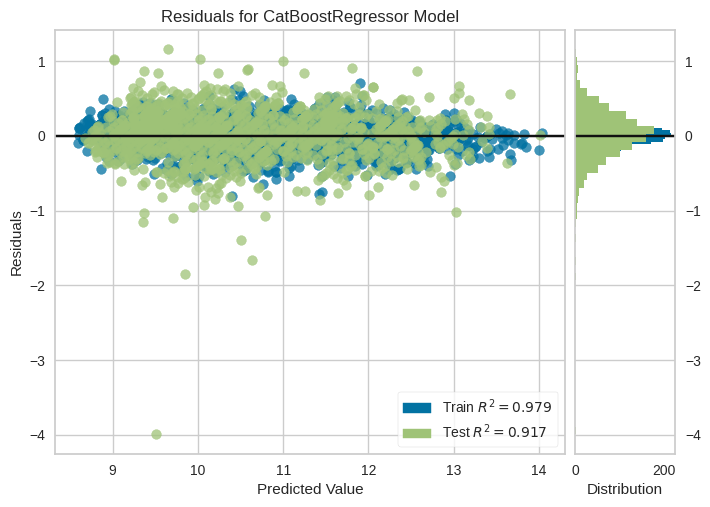

In [27]:
s4.plot_model(catboost_tuned,plot="residuals")

The spread of residuals across the predicted values appears to be relatively even.

Most residuals are clustered around the zero line, which indicates that the predictions are generally close to the true values.

There doesn't appear to be a systematic overestimation or underestimation across the predicted value spectrum since the residuals are distributed around the zero line. However, there are a few outliers, especially on the negative side of the residuals, indicating instances of higher underestimation. In underestimation, it means the actual value was higher than the predicted value, meaning a residual is above the zero line.

The histogram on the right side of the residuals plot shows the distribution of the residuals. The distribution looks approximately normal, centered around zero, which is a good sign for the model. However, it is skewed a little to the left, suggesting a few cases of larger underestimations.

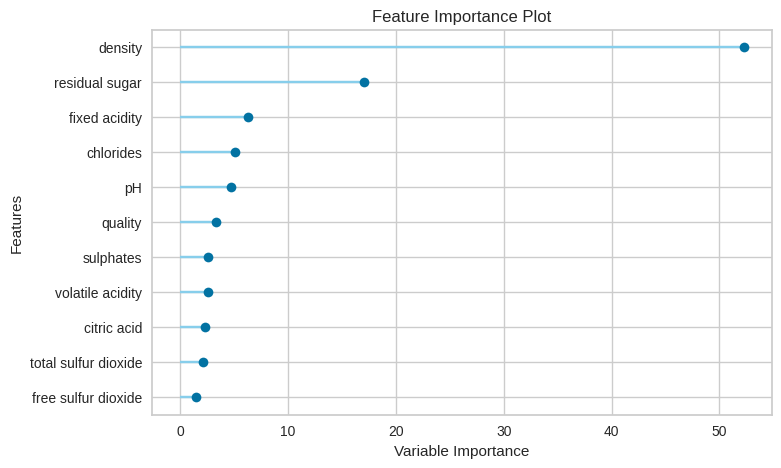

In [28]:
s4.plot_model(catboost_tuned,plot="feature_all")

Here it showed that for my BEST MODEL, the feature "density" was selected as the most important feature in predicting "alcohol".

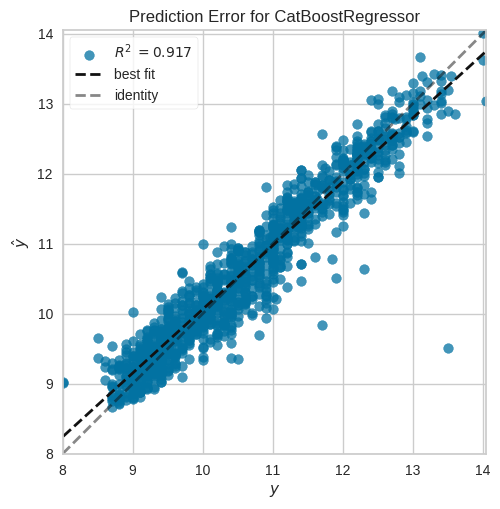

In [29]:
s4.plot_model(catboost_tuned,plot="error")

Here for prediction error, the ideal prediction follows the identity line, which indicates no error. The line of best fit of our predictions is VERY CLOSE to the identity line, suggesting that our BEST MODEL was a good performing model that predicted on the test data well.

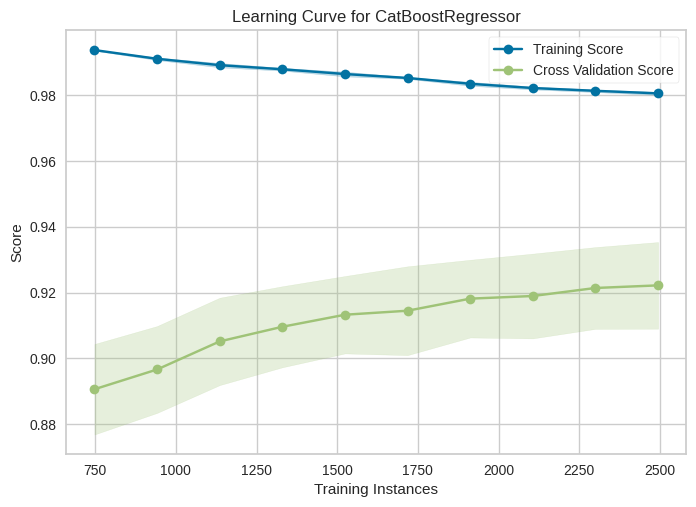

In [30]:
s4.plot_model(catboost_tuned,plot="learning")

 The training score (R2) starts high and remains relatively stable as more training instances are added. This suggests that the model fits the training data well, even with a small amount of data.

 he cross-validation score increases with the number of training instances. Initially, with fewer instances, the model does not generalize as well but improves as more data is provided. The increasing trend suggests that adding more data improves the model's performance on unseen data.

 The gap between the training score and the cross-validation score is a measure of the model's variance. A large gap indicates high variance, which means the model may be overfitting. Here, the gap is relatively small and seems to decrease slightly as more data is added, suggesting the model generalizes well and isn't overfitting significantly.

# **Interpret Model**

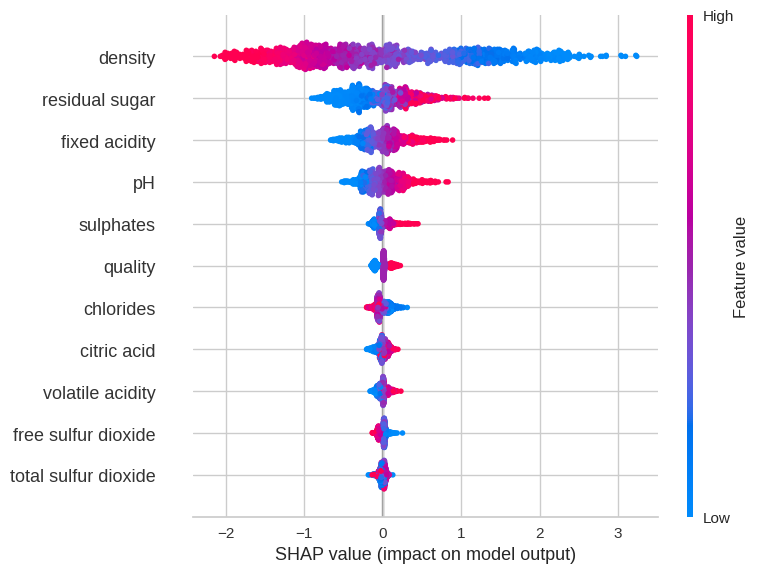

In [31]:
s4.interpret_model(catboost_tuned)

# **Predictions**

In [32]:
catboost_tuned_predict=s4.predict_model(catboost_tuned)
normalized_df_predict_f_select=s5.predict_model(model5)
normalized_df_predict=s3.predict_model(model3)
DD_df_predict=s2.predict_model(model2)
original_df_predict=s.predict_model(model1)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,0.2553,0.1223,0.3497,0.9172,0.0303,0.0243


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,0.4013,0.2681,0.5178,0.8260,0.0445,0.0379


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,0.2290,0.0993,0.3150,0.9364,0.0273,0.0218


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,0.2511,0.1088,0.3299,0.9250,0.0285,0.0239


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,0.2182,0.0875,0.2958,0.9426,0.0254,0.0206


My BEST MODEL was the catboost_tuned_predict model for the predictions on the test set. However, it did not have the best RMSE score. The best score RMSE went to the Model 1 that used the original dataset with duplicated values with non-normalized values. This was quite odd as this meant Model 1 predicted with the least error. I maintain that my BEST MODEL would perform the best on new unseen data and would be the most robust.

In [33]:
catboost_tuned_predict.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,quality,alcohol,prediction_label
4257,5.8,0.32,0.23,1.5,0.033,0.217102,-0.408546,0.98870,2.96,0.35,5,12.0,12.226857
4749,6.2,0.35,0.25,18.4,0.051,-0.429751,1.026960,0.99946,3.13,0.62,6,9.3,9.107196
4371,7.0,0.23,0.28,2.7,0.053,-1.135409,-1.091000,0.99372,3.18,0.56,5,9.3,9.874289
2639,9.2,0.14,0.37,1.1,0.034,0.040688,-1.279263,0.99136,3.05,0.55,6,11.6,11.554265
1166,6.1,0.45,0.27,0.8,0.039,-1.311823,-1.326329,0.99270,3.23,0.32,5,9.5,9.344477


This shows the top rows in my CatBoost Regressor best model and show thes the prediction label.

In [34]:
new_data = w_wine_df_Norm_DD.copy()
new_data.drop('alcohol', axis=1, inplace=True)
new_data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,quality
0,7.0,0.27,0.36,20.7,0.045,0.569932,0.744565,1.0010,3.00,0.45,6
1,6.3,0.30,0.34,1.6,0.049,-1.253019,-0.149685,0.9940,3.30,0.49,6
2,8.1,0.28,0.40,6.9,0.050,-0.312141,-0.973336,0.9951,3.26,0.44,6
3,7.2,0.23,0.32,8.5,0.058,0.687541,1.121091,0.9956,3.19,0.40,6
6,6.2,0.32,0.16,7.0,0.045,-0.312141,-0.055553,0.9949,3.18,0.47,6


This drops the 'alcohol' column in the normalized dataset with duplicates removed

In [35]:
# predict model on new_data
predictions = s.predict_model(catboost_tuned, data = new_data)
predictions.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,quality,prediction_label
0,7.0,0.27,0.36,20.700001,0.045,0.569932,0.744565,1.0010,3.00,0.45,6,8.761289
1,6.3,0.30,0.34,1.600000,0.049,-1.253019,-0.149685,0.9940,3.30,0.49,6,9.752742
2,8.1,0.28,0.40,6.900000,0.050,-0.312141,-0.973336,0.9951,3.26,0.44,6,10.640224
3,7.2,0.23,0.32,8.500000,0.058,0.687541,1.121091,0.9956,3.19,0.40,6,9.853739
6,6.2,0.32,0.16,7.000000,0.045,-0.312141,-0.055553,0.9949,3.18,0.47,6,9.487916


This shows the predictions on the modified preprocessed dataset with the "alcohol" column removed.

# **Exploratory Data Analysis**

In [36]:
from pandas_profiling import ProfileReport
#run profile
profile =  ProfileReport(w_wine_df, title = 'report - pandas profling', html={'style':{'full_width':True}})
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The EDA shows that "alcohol" is highly correlated with "density" in the Alert Section. Also I counted 2 outliers in the original dataset. 1 from "residual sugar" and 1 from free sulfur dioxide.

# **Correlation Table**

<AxesSubplot: >

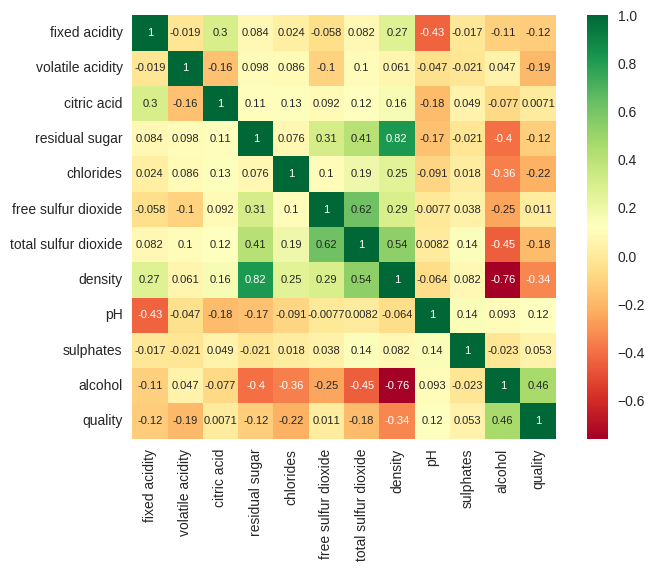

In [37]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


sns.heatmap(w_wine_df_Norm_DD.corr(), square=True, annot=True, annot_kws={"size":8}, cmap='RdYlGn')

This correlation table shows that "alcohol" had the highest correlation (-0.76) with density. It had a negative correlation meaning the model found a relationship that alcohol content increased as density decreased.

# **Single Feature Analysis**
# **Alcohol vs Density**

In [38]:
# Create arrays for features and target variable
y = w_wine_df_Norm_DD['alcohol']
X_density = w_wine_df_Norm_DD[['density']]


# Create the prediction space
prediction_space = np.linspace(min(w_wine_df_Norm_DD['density']), max(w_wine_df_Norm_DD['density'])).reshape(-1,1)
from sklearn.model_selection import train_test_split
w_wine_df_Norm_DD.head(3)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,0.569932,0.744565,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,-1.253019,-0.149685,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,-0.312141,-0.973336,0.9951,3.26,0.44,10.1,6


Here I compare the alcohol against solely the feature density.

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

from catboost import CatBoostRegressor
# 30% test, 70% train
X_train, X_test, y_train, y_test = train_test_split(X_density, y, test_size = 0.3, random_state=42)

# Create the regressor: reg
model = CatBoostRegressor()

# Fit the regressor to the training data
model.fit(X_train, y_train)

# Predict on the test data: y_pred
y_pred = model.predict(X_test)

# Print R^2 of TEST SET
print("R^2: {}".format(model.score(X_test, y_test)))

#Print RMSE of predictions on TEST SET
rmse = np.sqrt(mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error: {}".format(rmse))


Learning rate set to 0.0481
0:	learn: 1.1784723	total: 1.1ms	remaining: 1.09s
1:	learn: 1.1429353	total: 2.2ms	remaining: 1.1s
2:	learn: 1.1095950	total: 3.42ms	remaining: 1.14s
3:	learn: 1.0785049	total: 4.64ms	remaining: 1.16s
4:	learn: 1.0490095	total: 5.86ms	remaining: 1.17s
5:	learn: 1.0218211	total: 7.11ms	remaining: 1.18s
6:	learn: 0.9973352	total: 8.37ms	remaining: 1.19s
7:	learn: 0.9738173	total: 9.51ms	remaining: 1.18s
8:	learn: 0.9517673	total: 10.6ms	remaining: 1.17s
9:	learn: 0.9317280	total: 11.7ms	remaining: 1.16s
10:	learn: 0.9121804	total: 12.9ms	remaining: 1.16s
11:	learn: 0.8942678	total: 14.2ms	remaining: 1.17s
12:	learn: 0.8780473	total: 15.3ms	remaining: 1.16s
13:	learn: 0.8625963	total: 16.4ms	remaining: 1.15s
14:	learn: 0.8484054	total: 17.5ms	remaining: 1.15s
15:	learn: 0.8352340	total: 18.6ms	remaining: 1.15s
16:	learn: 0.8227626	total: 19.9ms	remaining: 1.15s
17:	learn: 0.8112854	total: 21ms	remaining: 1.15s
18:	learn: 0.8005585	total: 22ms	remaining: 1.14s
1

I calculated the R2 and RMSE value for the regression analysis for alcohol vs density. The R2= 0.6683677889662434 and RMSE= 0.7018298380260146

# **Finalize Model**

In [40]:
BEST_CATBOOST_TUNED_MODEL=s4.finalize_model(catboost_tuned)
BEST_CATBOOST_TUNED_MODEL

Pipeline(memory=Memory(location=None),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['fixed acidity',
                                             'volatile acidity', 'citric acid',
                                             'residual sugar', 'chlorides',
                                             'free sulfur dioxide',
                                             'total sulfur dioxide', 'density',
                                             'pH', 'sulphates', 'quality'],
                                    transformer=SimpleImputer())),
                ('categorical_imputer',
                 TransformerWrapper(include=[],
                                    transformer=SimpleImputer(strategy='most_frequent'))),
                ('clean_column_names',
                 TransformerWrapper(transformer=CleanColumnNames())),
                ('actual_estimator',
                 <catboost.core.CatBoostRegressor object at 0x790b9b196110>)])

# **Save Model**

In [41]:
s4.save_model(BEST_CATBOOST_TUNED_MODEL, 'pycaret_catboost_regression_pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['fixed acidity',
                                              'volatile acidity', 'citric acid',
                                              'residual sugar', 'chlorides',
                                              'free sulfur dioxide',
                                              'total sulfur dioxide', 'density',
                                              'pH', 'sulphates', 'quality'],
                                     transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=[],
                                     transformer=SimpleImputer(strategy='most_frequent'))),
                 ('clean_column_names',
                  TransformerWrapper(transformer=CleanColumnNames())),
                 ('actual_estimator',
                  <catboost.core.CatBoostRegressor object at 0x790b9b19611